In [179]:
import numpy as np
import warp as wp

# wp.config.quiet = True

# Explicitly initializing Warp is not necessary but
# we do it here to ensure everything is good to go.
wp.init()

# Everything else is solely to visualize the results.
import IPython
import matplotlib
import matplotlib.animation
import matplotlib.pyplot
import pyglet

import warp.render

matplotlib.pyplot.rc("animation", html="jshtml")
pyglet.options["headless"] = True

import sys
from tqdm import tqdm

In [180]:

# class Array3:
#     def __init__(self):
#         self = wp.array(dtype=wp.vec3)

In [181]:
# class Array3(wp.array):
#     def __init__(self):
#         self = wp.array(dtype=wp.vec3)
Array3 = wp.array(dtype=wp.vec3)

@wp.func
def contact_force(
    n: wp.vec3,  # normal vector
    v: wp.vec3,  # relative velocity
    c: float,    # penetration depth
    k_n: float,  # normal stiffness
    k_d: float,  # damping coefficient
    k_f: float,  # friction stiffness
    k_mu: float, # friction coefficient
) -> wp.vec3:
    vn = wp.dot(n, v)
    jn = c * k_n
    jd = min(vn, 0.0) * k_d

    # contact force
    fn = jn + jd

    # friction force
    vt = v - n * vn
    vs = wp.length(vt)

    if vs > 0.0:
        vt = vt / vs

    # Coulomb condition
    ft = wp.min(vs * k_f, k_mu * wp.abs(fn))

    # total force
    return -n * fn - vt * ft


# @wp.kernel
# def update(
#     grid: wp.uint64,
#     particle_x: Array3,
#     particle_v: Array3,
#     particle_f: Array3,
#     radius: float,
#     k_contact: float,
#     k_damp: float,
#     k_friction: float,
#     k_mu: float,
# ):
#     tid = wp.tid()

#     # order threads by cell
#     i = wp.hash_grid_point_id(grid, tid)
#     x = particle_x[i]
#     v = particle_v[i]
#     f = wp.vec3()
#     # ground contact
#     # n = wp.vec3(0.0, 1.0, 0.0)
#     # c = wp.dot(n, x)
#     # cohesion_ground = 0.02
#     # if c < cohesion_ground:
#     #     f = f + contact_force(n, v, c, k_contact, k_damp, 100.0, 0.5)
#     # particle contact
#     cohesion_particle = 0.0075
#     neighbors = wp.hash_grid_query(grid, x, radius * 5.0)
#     for index in neighbors:
#         if index != i:
#             # compute distance to point
#             n = x - particle_x[index]
#             d = wp.length(n)
#             err = d - radius * 2.0
#             if err <= cohesion_particle:
#                 n = n / d
#                 vrel = v - particle_v[index]

#                 f = f + contact_force(n, vrel, err, k_contact, k_damp, k_friction, k_mu)
#     particle_f[i] = f

In [182]:
@wp.func
def pow3(x: wp.Float) -> wp.Float:
    return x * x * x

@wp.func
def pow4(x: wp.Float) -> wp.Float:
    return x * x * x * x

@wp.func
def pow5(x: wp.Float) -> wp.Float:
    return x * x * x * x * x

V_MAX = 1e5
@wp.kernel
def update_boltz(
    grid: wp.uint64,
    particle_x: Array3,
    particle_v: Array3,
    particle_f: Array3,
    dist_o0: float,
    dist_o1: float,
    dist_o2: float,
    dist_potential_cut: float,
    dt: float,
    diameter: float,
    n_test: int
):
    tid = wp.tid()
    state = wp.rand_init(42, tid)
    i = wp.hash_grid_point_id(grid, tid)
    x = particle_x[i]
    v = particle_v[i]
    f = wp.vec3(0.0, 0.0, 0.0)
    neighbors = wp.hash_grid_query(grid, x, dist_o2)
    if n_test == 1:
        collision_prob_o0 = dt * diameter * diameter * wp.pi / pow3(dist_o0)
        collision_prob_o1 = dt * diameter * diameter * diameter * wp.pi / 2.0 / pow4(dist_o0)
        collision_prob_o2 = dt * diameter * diameter * diameter * diameter * wp.pi / 8.0 / pow5(dist_o0)
    else:
        collision_prob_o0 = dt * diameter * diameter * wp.pi / float(n_test) / pow3(dist_o0)
        collision_prob_o1 = dt * diameter * diameter * diameter * wp.pi / float(n_test) / 2.0 / pow4(dist_o0)
        collision_prob_o2 = dt * diameter * diameter * diameter * diameter * wp.pi / float(n_test) / 8.0 / pow5(dist_o0)
    for index in neighbors:
        if index == i:
            continue
        dx = x - particle_x[index]
        dv = v - particle_v[index]
        d = wp.length(dx)
        d2 = wp.length_sq(dx)
        dspeed = wp.length(dv)
        dv_dx = wp.dot(dv, dx)
        if d < dist_o0:
            if wp.randf(state) < collision_prob_o0 * dspeed and dv_dx < 0:
                particle_v[index] += dx * dv_dx / d2
                # # particle_v[index] = particle_v[index] + dx * dv_dx / d2
                # print(dx * dv_dx / d2)
                particle_v[i] -= dx * dv_dx / d2
                break
                # f = f - dx * wp.max(dv_dx / d2, -V_MAX)
        elif d < dist_o1:
            # dv2 = wp.length_sq(dv)
            # vec_k = dx / d
            if wp.randf(state) < - dv_dx / d * collision_prob_o1:
                particle_v[index] += dx * dv_dx / d2
                particle_v[i] -= dx * dv_dx / d2
                break
                # f = f - dx * wp.max(dv_dx / d2, -V_MAX)
        elif d < dist_o2:
            if wp.randf(state) < - dv_dx * dv_dx / d2 / dspeed * collision_prob_o2:
                particle_v[index] += dx * dv_dx / d2
                particle_v[i] -= dx * dv_dx / d2
                break
    particle_f[i] = f

In [183]:
# check random
@wp.kernel
def generate_random_numbers(
    output: wp.array(dtype=float),
    ret_bool: wp.array(dtype=wp.vec3b),
    dt: float,
    diameter: float,
    n_test: int,
    dist_o0: float,
):
    tid = wp.tid()
    state = wp.rand_init(0, tid)
    collision_prob_o0 = dt * diameter * diameter * wp.pi / float(n_test) / pow3(dist_o0)
    collision_prob_o1 = dt * diameter * diameter * diameter * wp.pi / float(n_test) / 2.0 / pow4(dist_o0)
    collision_prob_o2 = dt * diameter * diameter * diameter * diameter * wp.pi / float(n_test) / 8.0 / pow5(dist_o0)
    output[tid] = wp.randf(state)
    b0 = wp.int8(output[tid] < collision_prob_o0)
    b1 = wp.int8(output[tid] < collision_prob_o1)
    b2 = wp.int8(output[tid] < collision_prob_o2)
    ret_bool[tid] = wp.vec3b(b0, b1, b2)

# for i in tqdm(range(10000)):
#     output = wp.empty((131072,), dtype=float)
#     ret_bool = wp.empty((131072,), dtype=wp.vec3b)
#     wp.launch(
#         kernel=generate_random_numbers,
#         dim=131072,
#         inputs=[output, ret_bool, 0.02, 0.1, 1, 0.5]
#     )

# print(wp.to_torch(ret_bool).sum(dim=0))

In [184]:
@wp.kernel
def sample_unit_sphere_surface(output: wp.array(dtype=wp.vec3)):
    tid = wp.tid()
    state = wp.rand_init(0, tid)
    output[tid] = wp.sample_unit_sphere_surface(state)


@wp.kernel
def sample_unit_cube(output: wp.array(dtype=wp.vec3)):
    tid = wp.tid()
    state = wp.rand_init(0, tid)
    output[tid] = wp.sample_unit_cube(state)


n = 131072
xs = wp.empty((n,), dtype=wp.vec3)
vs = wp.empty((n,), dtype=wp.vec3)
fs = wp.empty((n,), dtype=wp.vec3)
wp.launch(kernel=sample_unit_sphere_surface, dim=n, inputs=[vs])
wp.launch(kernel=sample_unit_cube, dim=n, inputs=[xs])
xs = xs * 16.0 + wp.vec3(8.0, 8.0, 8.0)
# print((wp.to_torch(vs) ** 2).mean(), (wp.to_torch(xs)).mean())

grid = wp.HashGrid(32, 32, 32)
grid_cell_size = 0.5
sim_dt = 0.002
sim_t = 100.0
m = None
for i in range(1000):
    grid.build(xs, grid_cell_size)
    wp.launch(
        kernel=update_boltz,
        dim=n,
        inputs=[
            grid.id,
            xs,
            vs,
            fs,
            0.5,  # dist_o0
            1.0,  # dist_o1
            1.5,  # dist_o2
            2.0,  # dist_potential_cut
            sim_dt,
            0.1,  # diameter
            1,  # n_test
        ],
    )
    if m and m - (wp.to_torch(vs) ** 2).mean() > 1e-5:
        print(m, float((wp.to_torch(vs) ** 2).mean()))
    m = (wp.to_torch(vs) ** 2).mean()

Module __main__ 5b17f7a load on device 'cuda:0' took 17.12 ms  (cached)


In [ ]:
@wp.kernel
def integrate_no_boundary(
    x: wp.array(dtype=wp.vec3), # pyright: ignore[reportInvalidTypeForm]
    v: wp.array(dtype=wp.vec3), # pyright: ignore[reportInvalidTypeForm]
    f: wp.array(dtype=wp.vec3), # pyright: ignore[reportInvalidTypeForm]
    gravity: wp.vec3,
    dt: float,
    inv_mass: float,
):
    tid = wp.tid()
    v[tid] += f[tid] * inv_mass * dt + gravity * dt
    x[tid] += v[tid] * dt

@wp.kernel
def integrate_periodic(         # Apply periodic boundary conditions
    x: wp.array(dtype=wp.vec3), # pyright: ignore[reportInvalidTypeForm]
    v: wp.array(dtype=wp.vec3), # pyright: ignore[reportInvalidTypeForm]
    f: wp.array(dtype=wp.vec3), # pyright: ignore[reportInvalidTypeForm]
    p: wp.array(dtype=float),   # pyright: ignore[reportInvalidTypeForm]
    gravity: wp.vec3,
    dt: float,
    inv_mass: float,
    lower: wp.vec3,
    length: wp.vec3,
    offset: wp.vec3
):
    tid = wp.tid()
    # v[tid] += f[tid] * inv_mass * dt + gravity * dt
    v[tid] += f[tid]
    x[tid] += v[tid] * dt
    p[tid] = 0.0
    dx = x[tid] - lower
    for i in range(3):
        if dx[i] > length[i]:
            x[tid][i] = lower[i] + wp.mod(dx[i], length[i])
            p[tid] += 2.0 / (inv_mass * dt) * v[tid][i]
        elif dx[i] < 0.0:
            x[tid][i] = lower[i] + length[i] - wp.mod(-dx[i], length[i])
            p[tid] -= 2.0 / (inv_mass * dt) * v[tid][i]
    x[tid] = lower + wp.mod(x[tid] + offset - lower, length)

@wp.kernel
def integrate_bounce(
    x: wp.array(dtype=wp.vec3), # pyright: ignore[reportInvalidTypeForm]
    v: wp.array(dtype=wp.vec3), # pyright: ignore[reportInvalidTypeForm]
    f: wp.array(dtype=wp.vec3), # pyright: ignore[reportInvalidTypeForm]
    p: wp.array(dtype=float),   # pyright: ignore[reportInvalidTypeForm]
    gravity: wp.vec3,
    dt: float,
    inv_mass: float,
    lower: wp.vec3,
    length: wp.vec3
):
    tid = wp.tid()
    # v[tid] += f[tid] * inv_mass * dt + gravity * dt
    v[tid] += f[tid]
    x[tid] += v[tid] * dt
    p[tid] = 0.0
    for i in range(3):
        while True:
            dx = x[tid] - lower
            if dx[i] > length[i]:
                x[tid][i] = lower[i] + 2.0 * length[i] - dx[i]
                p[tid] += 2.0 / (inv_mass * dt) * v[tid][i]
                v[tid][i] = -v[tid][i]
            elif dx[i] < 0.0:
                x[tid][i] = lower[i] - dx[i]
                p[tid] -= 2.0 / (inv_mass * dt) * v[tid][i]
                v[tid][i] = -v[tid][i]
            else:
                break

In [186]:
def create_particle_volume(
    num_particles: int,
    lower: wp.vec3,
    higher: wp.vec3,
) -> wp.array(dtype=wp.vec3): # pyright: ignore[reportInvalidTypeForm]
    v = higher - lower
    points = np.random.rand(num_particles, 3) * v + lower
    print(f"N={num_particles}, n={num_particles / v[0] / v[1] / v[2]:.2f}")
    return wp.array(points, dtype=wp.vec3)

In [187]:
import matplotlib.pyplot as plt
def plot_pos(points):
    plt.figure(figsize=(16, 12))
    plt.scatter(points.numpy()[:, 0], points.numpy()[:, 1], s=0.1, label='X-Y plane')
    plt.scatter(points.numpy()[:, 0], points.numpy()[:, 2], s=0.1, label='X-Z plane')
    plt.legend()
    plt.show()
    plt.close()

In [188]:
@warp.kernel
def length_f(velocities: wp.array(dtype=wp.vec3), speeds: wp.array(dtype=float)): # pyright: ignore[reportInvalidTypeForm]
    speeds[wp.tid()] = wp.length(velocities[wp.tid()])

N=131072, n=32.00


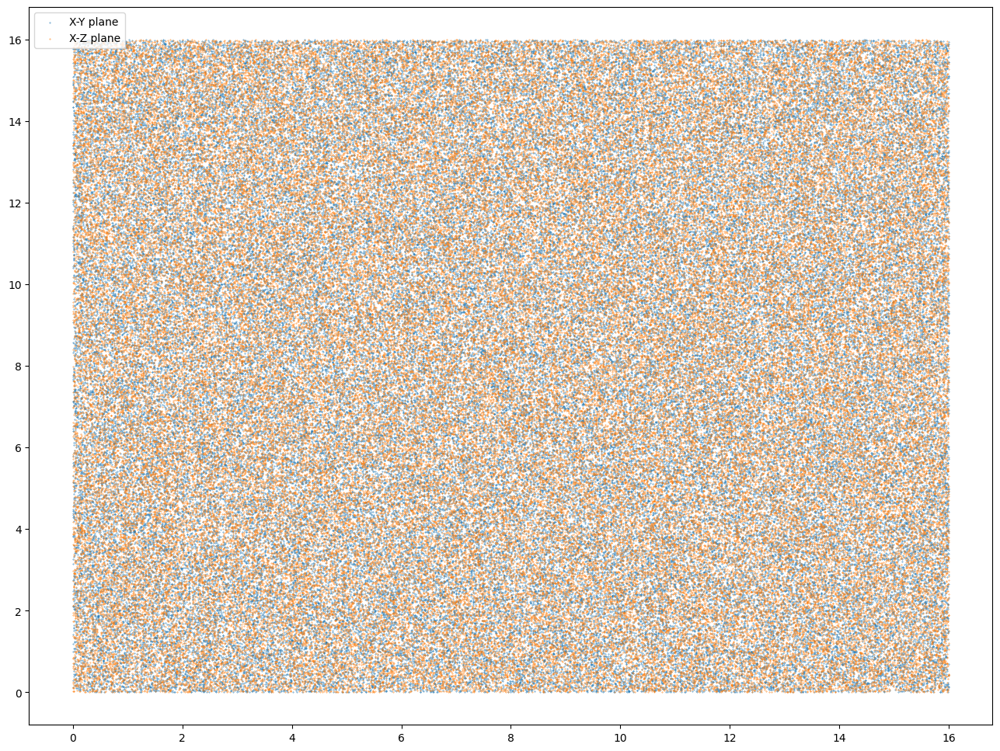

  0%|          | 4/20000 [00:01<1:55:25,  2.89it/s]

Module __main__ 4658e28 load on device 'cuda:0' took 1648.67 ms  (compiled)


100%|██████████| 20000/20000 [01:16<00:00, 261.32it/s]


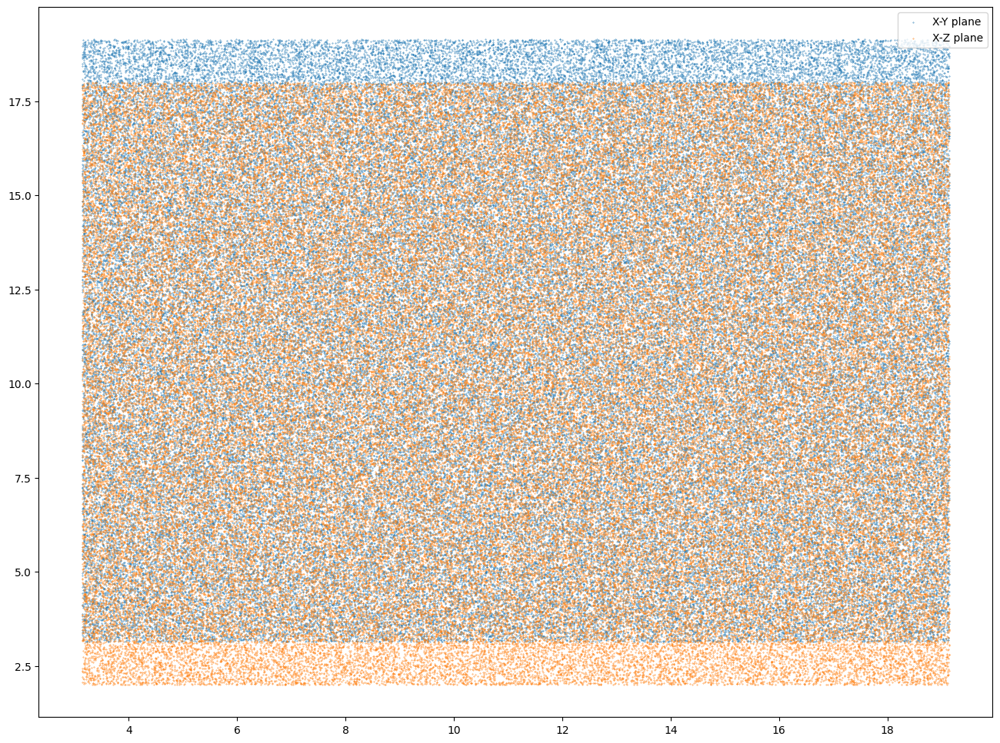

In [189]:
point_radius = 0.05
inv_mass = 1 / 200
temperature = 1.0
k_contact = 8e3
k_damp = 2.0
k_friction = 1.0
k_mu = 0.5
lower_boundary = wp.vec3(0.0, 0.0, 0.0)
L = 16.0
length = wp.vec3(L, L, L)

points = create_particle_volume(131072, lower_boundary, lower_boundary + length)
speeds = np.sqrt(temperature * inv_mass * 3)
thetas = np.random.rand(len(points)) * 2.0 * np.pi
phis = np.arccos(1 - 2 * np.random.rand(len(points)))
velocities = np.zeros((len(points), 3), dtype=float)
velocities[:, 0] = speeds * np.sin(phis) * np.cos(thetas)
velocities[:, 1] = speeds * np.sin(phis) * np.sin(thetas)
velocities[:, 2] = speeds * np.cos(phis)
speeds = wp.array(np.ones(len(points), dtype=float) * speeds, dtype=float)
velocities = wp.array(velocities, dtype=wp.vec3)

forces = wp.empty_like(points)
bounded_pressures = wp.zeros(len(points), dtype=float)
grid = wp.HashGrid(32, 32, 32)
grid_cell_size = 0.5
sim_dt = 0.005
sim_t = 100.0
plot_pos(points)
pressure = np.zeros(int(sim_t / sim_dt), dtype=float)
pooled_pressures = []
mean_v2 = []
i = pre_i = 0
for t in tqdm(np.linspace(0, sim_t, int(sim_t / sim_dt))):
    grid.build(points, grid_cell_size)
    wp.launch(
            kernel=update_boltz,
            dim=points.shape,
            inputs=[
                grid.id,
                points,
                velocities,
                forces,
                grid_cell_size,
                grid_cell_size * 2,
                grid_cell_size * 3,
                grid_cell_size * 8,
                sim_dt,
                point_radius * 2,
                1
            ],
        )
    # wp.launch(
    #     kernel=update,
    #     dim=points.shape,
    #     inputs=(
    #         grid.id,
    #         points,
    #         velocities,
    #         forces,
    #         point_radius,
    #         8e3,
    #         0,
    #         0,
    #         0,
    #     ),
    # )
    wp.launch(
            kernel=integrate_periodic,
            dim=points.shape,
            inputs=[
                points,
                velocities,
                forces,
                bounded_pressures,
                (0.0, 0.0, 0.0),
                sim_dt,
                inv_mass,
                lower_boundary,
                length,
                wp.vec3(wp.pi, wp.pi, 2.0)
            ],
        )
    pressure[i] = wp.to_torch(bounded_pressures).sum().item() / (length[0] * length[1] * 2 + length[1] * length[2] * 2 + length[2] * length[0] * 2)
    if t % 1.0 < sim_dt and i > 0:
        wp.launch(
            kernel=length_f,
            dim=points.shape,
            inputs=[
                velocities,
                speeds
            ],
        )
        v2_torch = wp.to_torch(speeds) ** 2
        # print('\r', float(v2_torch.mean()), float(v2_torch.min()), float(v2_torch.max()), end='')
        mean_v2.append((wp.to_torch(speeds) ** 2).mean())
        pooled_pressures.append(pressure[pre_i:i+1].mean())
        pre_i = i
    i += 1
plot_pos(points)

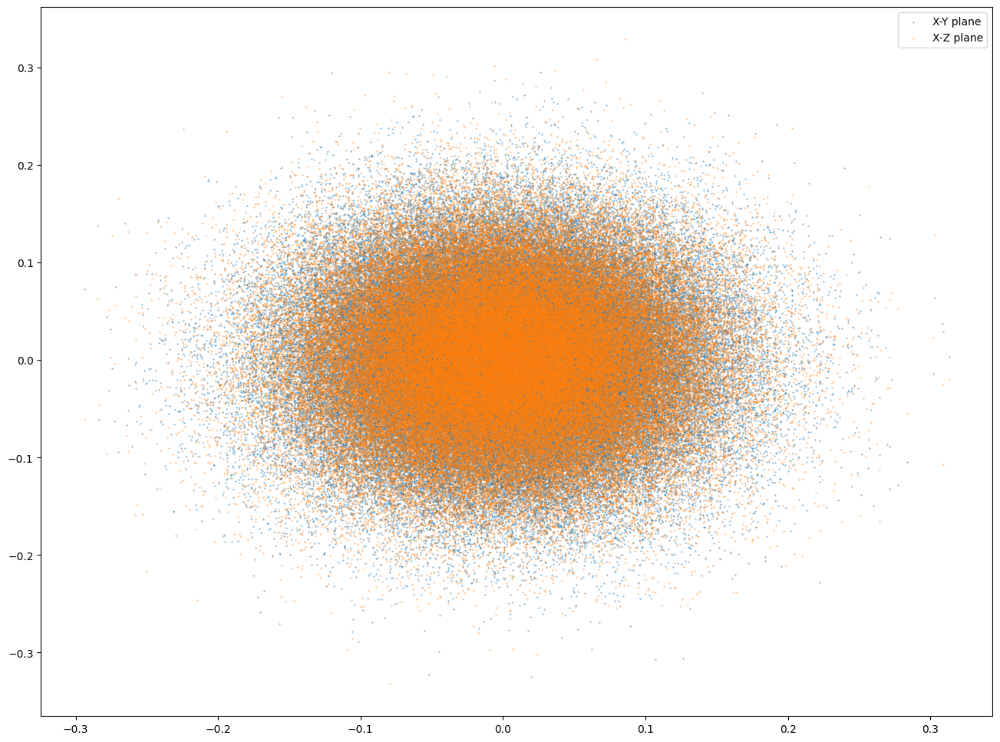

In [190]:
plot_pos(velocities)

In [191]:
velocities

array(shape=(131072,), dtype=vec3f)

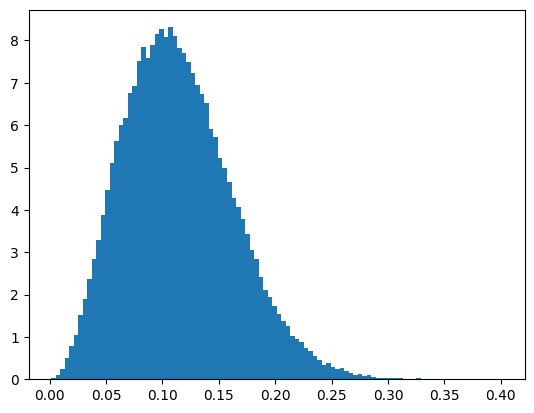

In [192]:
speeds = wp.zeros(len(points), dtype=float)
wp.launch(kernel=length_f, inputs=[velocities, speeds], dim=velocities.shape)
plt.hist(speeds.numpy(), bins=100, density=True)
plt.show()

<BarContainer object of 200 artists>

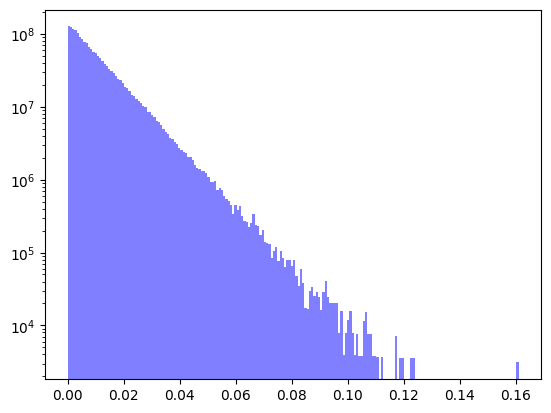

In [193]:
hist, bins = np.histogram(speeds.numpy()**2, bins=200)
bin_widths = np.diff(bins)
bin_centers = (bins[:-1] + bins[1:]) / 2
norm_factor = bin_widths * np.sqrt(bin_centers)
normalized_hist = hist / norm_factor
plt.yscale('log')
plt.bar(bin_centers, normalized_hist, width=bin_widths, color='b', alpha=0.5, label='Data')

In [194]:

wp.to_torch(bounded_pressures).sum().item() / (length[0] * length[1] * 2 + length[1] * length[2] * 2 + length[2] * length[0] * 2)

848.8518880208334

In [195]:
wp.to_torch(bounded_pressures).sum()

tensor(1303836.5000, device='cuda:0')

In [196]:
len(pooled_pressures)

100

C:\Users\hy-wu.DESKTOP-G355NC5\AppData\Local\Temp\ipykernel_32188\3665852074.py:27: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  axs[1].set_yscale('log')


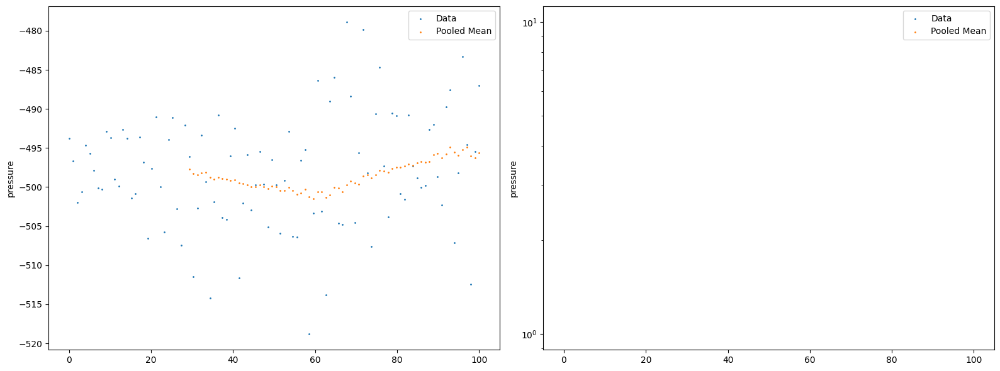

In [197]:
import numpy as np
from scipy.optimize import curve_fit


x_data = np.linspace(0, sim_t, len(pooled_pressures))
y_data = np.array(pooled_pressures)

# def decay_func(x, a, b, c):
#     return a / (b + np.exp(c * x ** 0.15))

# params, _ = curve_fit(decay_func, x_data, y_data, p0=(1, 10, 0.5))
params = np.polyfit(x_data, y_data, 6)
w = 30
fig, axs = plt.subplots(1, 2, figsize=(16, 6))
# Linear scale
axs[0].scatter(x_data, y_data, s=1, label='Data')
# axs[0].plot(x_data, decay_func(x_data, *params), color='red', label='Fit')
# axs[0].plot(x_data, np.polyval(params, x_data), color='red', label='Fit')
axs[0].scatter(x_data[w-1:], np.convolve(y_data, np.ones(w), "valid") / w, s=1, label='Pooled Mean')
axs[0].set_ylabel('pressure')
axs[0].legend()
# Log scale
axs[1].scatter(x_data, y_data, s=1, label='Data')
# axs[1].plot(x_data, decay_func(x_data, *params), color='red', label='Fit')
# axs[1].plot(x_data, np.polyval(params, x_data), color='red', label='Fit')
axs[1].scatter(x_data[w-1:], np.convolve(y_data, np.ones(w), "valid") / w, s=1, label='Pooled Mean')
axs[1].set_yscale('log')
axs[1].set_ylabel('pressure')
axs[1].legend()

plt.tight_layout()
plt.legend()

In [198]:
params

array([ 2.24555562e-09, -6.24135775e-07,  6.25322738e-05, -2.69441426e-03,
        4.74248431e-02, -3.41219853e-01, -4.96688526e+02])

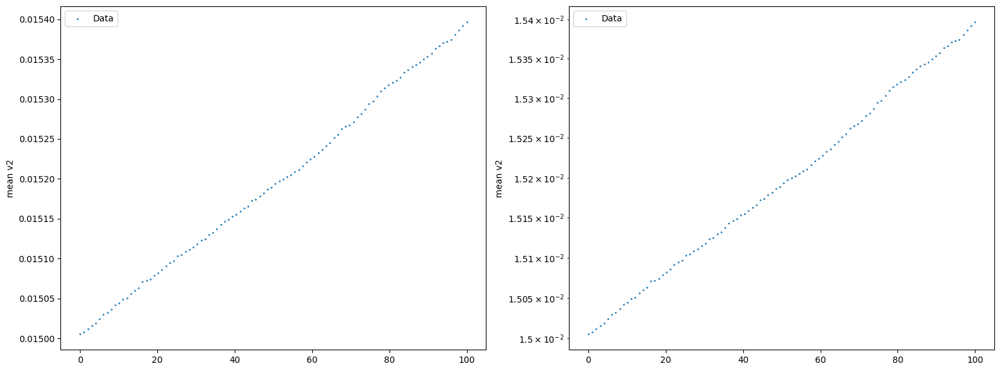

In [199]:
y_data = np.array([v.cpu() for v in mean_v2])
def decay_func(x, a, b, c):
    return a / (b + np.exp(c * x ** 0.15))
fitted = False
try:
    params, _ = curve_fit(decay_func, x_data, y_data, p0=(1, 10, 0.4))
    fitted = True
except Exception as e:
    print(f"Error occurred: {e}")
fitted = False

fig, axs = plt.subplots(1, 2, figsize=(16, 6))

# Linear scale
axs[0].scatter(x_data, y_data, s=1, label='Data')
if fitted:
    axs[0].plot(x_data, decay_func(x_data, *params), color='red', label='Fit')
axs[0].set_ylabel('mean v2')
axs[0].legend()

# Log scale
axs[1].scatter(x_data, y_data, s=1, label='Data')
if fitted:
    axs[1].plot(x_data, decay_func(x_data, *params), color='red', label='Fit')
axs[1].set_yscale('log')
axs[1].set_ylabel('mean v2')
axs[1].legend()

plt.tight_layout()
plt.legend()

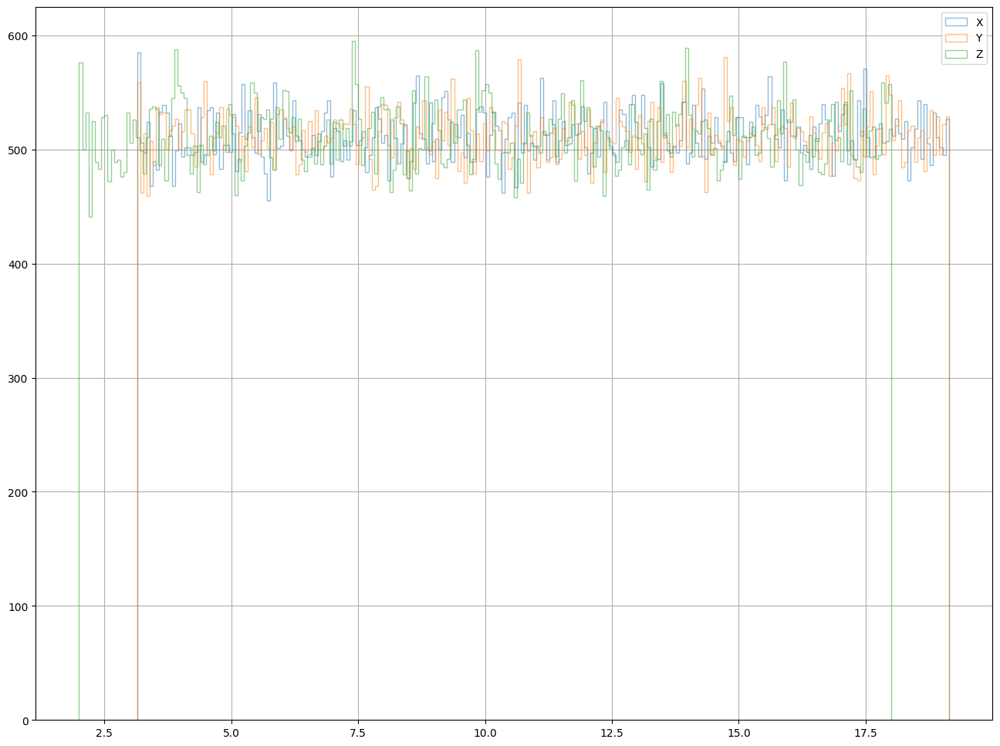

In [200]:
plt.figure(figsize=(16, 12))
plt.hist(points.numpy()[:, 0], bins=256, histtype='step', alpha=0.5, label='X')
plt.hist(points.numpy()[:, 1], bins=256, histtype='step', alpha=0.5, label='Y')
plt.hist(points.numpy()[:, 2], bins=256, histtype='step', alpha=0.5, label='Z')
plt.grid()
plt.legend()
plt.show()

In [201]:
points.numpy(), points.shape

(array([[ 6.296845 ,  9.620894 ,  2.5183983],
        [10.797614 ,  6.6824307, 15.047002 ],
        [ 5.8770227, 19.122677 , 17.144695 ],
        ...,
        [14.084143 , 11.864551 , 17.906427 ],
        [14.79536  ,  7.3145695, 15.195347 ],
        [13.832101 , 11.154168 ,  5.6883116]], dtype=float32),
 (131072,))

In [202]:
200 * 60 * 64

768000

In [203]:
1 / 60 / 64

0.00026041666666666666

In [204]:
32 ** 3

32768

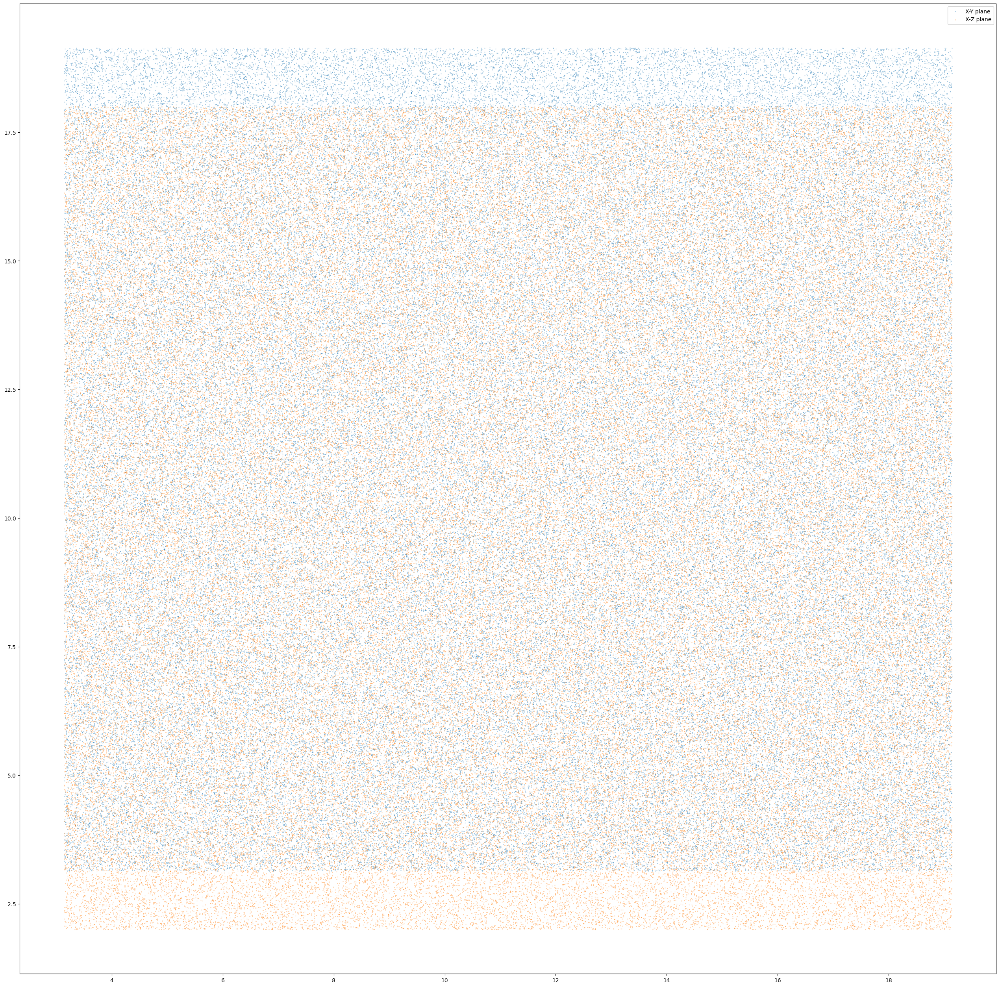

In [205]:
plt.figure(figsize=(32, 32))
plt.scatter(points.numpy()[:, 0], points.numpy()[:, 1], s=0.1, label='X-Y plane')
plt.scatter(points.numpy()[:, 0], points.numpy()[:, 2], s=0.1, label='X-Z plane')
plt.legend()
plt.savefig('points.pdf')